### Objective: To train additoinal regression models. 

Trying new stuff. 

In [1]:
import mlflow
from mlflow.models import infer_signature

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from Bio.SeqUtils.IsoelectricPoint import IsoelectricPoint as IP
from developability import data as data_
from abnumber import Chain

from sklego.preprocessing import FormulaicTransformer


from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, average_precision_score, roc_auc_score, accuracy_score, f1_score    
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import Lasso, Ridge, ElasticNet, LinearRegression
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from sklearn.neighbors import KNeighborsRegressor

from tqdm.notebook import tqdm
import tempfile
from dill import dump, load

from developability.utils import ls
from developability.modeling import  *
from developability.model_pipelines import make_formula_pipeline

## retina display
%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_rows', 999)
pd.set_option('display.max_columns', 999)

import warnings
warnings.filterwarnings("ignore")
# paths 

%load_ext autoreload
%autoreload 2

### Load the data and combine into one dataset. 

In [2]:
data_path = Path(data_.__path__[0])
training_path = data_path / 'train'
all_antibody_df = (pd.read_parquet(training_path/f'train_04-26-2024.parquet')
                   .rename(columns = {'HeparinRRT_scaled':'HeparinRRT'})
                   .drop(columns = ['HeparinRRT>=1'])
                   )
all_antibody_df.index.name = 'antibody'


pdbs_path = data_path/'pdbs'
experimental_data = data_path/'experimental_data'
antibody_df = pd.read_csv(experimental_data/'AntibodySequences.csv')

# map a name    
name_to_project = dict(zip(antibody_df['Name'], antibody_df['Project']))

all_antibody_df.insert(1, 'Project', all_antibody_df.index.map(name_to_project))


# combine
therapeutic_antibodies = (pd.read_parquet(training_path/'therapeutic_antibody_descriptor_results.parquet')
                          .rename(columns = {'Heparin':'HeparinRRT'})
                          .set_index('antibody')
                          .drop(columns = ['FcRn','Heparin>=0.85','VH_VL_charge_at_ph7'])
                          )

therapeutic_antibodies.insert(1, 'Project' ,'Therapeutic')


data = pd.concat([therapeutic_antibodies, all_antibody_df])

In [13]:
data.to_parquet(training_path/'Therapeutic_and_internal_antibodies.parquet')

In [3]:
data.head()

,HeparinRRT,Project,HCDR1_APBS_pos,HCDR1_APBS_neg,HCDR1_APBS_net,HCDR2_APBS_pos,HCDR2_APBS_neg,HCDR2_APBS_net,HCDR3_APBS_pos,HCDR3_APBS_neg,HCDR3_APBS_net,HFR1_APBS_pos,HFR1_APBS_neg,HFR1_APBS_net,HFR2_APBS_pos,HFR2_APBS_neg,HFR2_APBS_net,HFR3_APBS_pos,HFR3_APBS_neg,HFR3_APBS_net,HFR4_APBS_pos,HFR4_APBS_neg,HFR4_APBS_net,LCDR1_APBS_pos,LCDR1_APBS_neg,LCDR1_APBS_net,LCDR2_APBS_pos,LCDR2_APBS_neg,LCDR2_APBS_net,LCDR3_APBS_pos,LCDR3_APBS_neg,LCDR3_APBS_net,LFR1_APBS_pos,LFR1_APBS_neg,LFR1_APBS_net,LFR2_APBS_pos,LFR2_APBS_neg,LFR2_APBS_net,LFR3_APBS_pos,LFR3_APBS_neg,LFR3_APBS_net,LFR4_APBS_pos,LFR4_APBS_neg,LFR4_APBS_net,HCDR_APBS_pos,HCDR_APBS_neg,HCDR_APBS_net,LCDR_APBS_pos,LCDR_APBS_neg,LCDR_APBS_net,HFR_APBS_pos,HFR_APBS_neg,HFR_APBS_net,LFR_APBS_pos,LFR_APBS_neg,LFR_APBS_net,HC_APBS_pos,HC_APBS_neg,HC_APBS_net,LC_APBS_pos,LC_APBS_neg,LC_APBS_net,TOTAL_CDR_APBS_pos,TOTAL_CDR_APBS_neg,TOTAL_CDR_APBS_net,TOTAL_FR_APBS_pos,TOTAL_FR_APBS_neg,TOTAL_FR_APBS_net,TOTAL_APBS_pos,TOTAL_APBS_neg,TOTAL_APBS_net
antibody,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
adalimumab,0.79,Therapeutic,361.422343,-794.503791,-433.081449,1555.624126,-4014.715450,-2459.091324,2875.086488,-138.003294,2737.083194,5376.458039,-1771.257720,3605.200319,2726.475633,-584.411432,2142.064200,3398.963679,-1368.871898,2030.091781,905.524940,-973.487817,-67.962877,7088.950311,-2.623292,7086.327019,1842.767512,0.000000,1842.767512,3232.607354,-34.553594,3198.053760,5204.403827,-935.352752,4269.051075,6533.142402,-21.319271,6511.823132,6140.552634,-104.698825,6035.853809,1542.070672,-1031.505891,510.564781,4792.132957,-4947.222536,-155.089579,12164.325177,-37.176886,12127.148291,12407.422291,-4698.028867,7709.393424,19420.169535,-2092.876739,17327.292796,17199.555248,-9645.251403,7554.303845,31584.494712,-2130.053625,29454.441087,16956.458134,-4984.399421,11972.058712,31827.591826,-6790.905606,25036.686220,48784.049960,-11775.305027,37008.744932
daclizumab,0.84,Therapeutic,4252.553904,0.000000,4252.553904,4452.876492,-904.794295,3548.082197,3911.936888,0.000000,3911.936888,14311.015341,-193.586163,14117.429178,1868.888108,-38.688851,1830.199256,4672.451210,-414.558541,4257.892669,1996.455362,-125.736264,1870.719098,2912.056050,-214.503158,2697.552891,2848.982419,0.000000,2848.982419,6021.840255,0.000000,6021.840255,3227.953846,-1014.915103,2213.038743,10027.781235,0.000000,10027.781235,8142.327827,-283.031831,7859.295996,1246.512062,-635.948490,610.563573,12617.367283,-904.794295,11712.572988,11782.878723,-214.503158,11568.375565,22848.810021,-772.569820,22076.240201,22644.574971,-1933.895424,20710.679547,35466.177304,-1677.364115,33788.813190,34427.453694,-2148.398582,32279.055112,24400.246007,-1119.297454,23280.948553,45493.384992,-2706.465243,42786.919748,69893.630999,-3825.762697,66067.868302
ganitumab,0.79,Therapeutic,1818.147090,0.000000,1818.147090,6910.914448,0.000000,6910.914448,2961.303964,-484.904947,2476.399018,10333.605343,-525.798048,9807.807295,2872.797423,-281.600949,2591.196475,11761.616999,-147.382398,11614.234601,360.371905,-1259.033101,-898.661196,4405.906664,-170.769361,4235.137303,2334.634695,0.000000,2334.634695,1148.865688,-288.326494,860.539194,3364.619614,-1193.814546,2170.805067,620.200783,-1222.838265,-602.637481,3967.226838,-3170.419029,796.807809,1430.429745,-791.895867,638.533878,11690.365502,-484.904947,11205.460556,7889.407047,-459.095855,7430.311192,25328.391670,-2213.814495,23114.577175,9382.476980,-6378.967707,3003.509273,37018.757173,-2698.719442,34320.037731,17271.884027,-6838.063562,10433.820465,19579.772550,-944.000802,18635.771748,34710.868651,-8592.782203,26118.086448,54290.641200,-9536.783004,44753.858196
vedolizumab,0.54,Therapeutic,0.000000,-2649.100853,-2649.100853,4492.540426,-5860.854936,-1368.314511,0.000000,-6989.631169,-6989.631169,6391.205916,-986.398297,5404.807619,3360.681228,0.000000,3360.681228,3163.553567,-2239.208472,924.345095,306.504321,-1241.789054,-935.284733,3087.786259,-636.6

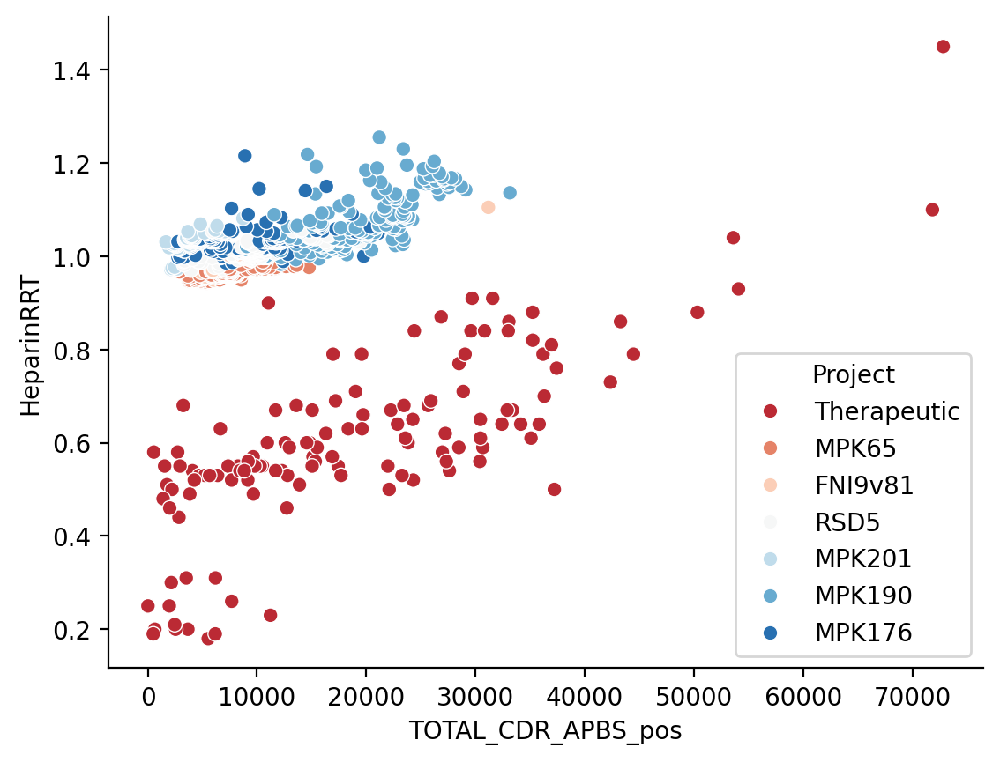

In [4]:
sns.scatterplot(data =data, x=  'TOTAL_CDR_APBS_pos', y= 'HeparinRRT' , hue = 'Project', palette='RdBu')
sns.despine()

In [5]:
def has_number(s): 
    for c in s: 
        if c.isdigit():
            return True
        
    return False

columns = all_antibody_df.columns
tracking_uri = 'http://127.0.0.1:5000'

In [6]:
feature_sets = {'positive_regions': [col for col in columns if col.endswith('pos') and has_number(col)],
                'postive_cdr': [col for col in columns if col.endswith('pos') and has_number(col) and 'CDR' in col],
                'net_regions': [col for col in columns if col.endswith('net') and has_number(col)], 
                'all': [col for col in columns if 'APBS' in col],
                }
for key in feature_sets: 
    feature_sets[key].append('Project')

feature_sets_with_cdr_apbs_pos =  feature_sets.copy()
feature_sets_with_cdr_apbs_pos['CDR_APBS_pos'] = ['TOTAL_CDR_APBS_pos', 'Project']



In [7]:
data.Project.value_counts()

Project
MPK190         179
MPK65          131
MPK176         131
MPK201         130
Therapeutic    128
RSD5           127
FNI9v81         17
Name: count, dtype: int64

### Train with hold out of project for conditional intercept

In [8]:
%%capture
experiment_name = 'RegressionWithConditionalIntercept1'
models = ['linear']

pipeline_kws = dict(intercept='Project',include_slope=False)

projects = data['Project'].unique()

for project in projects: 
    description = f'Conditional intercept models for {project}.'
    train = data.query('Project!=@project')

    exp = MLFlowExperiment(train,
                           target='HeparinRRT', 
                           experiment_name=experiment_name,
                           regression=True, 
                           feature_sets = feature_sets_with_cdr_apbs_pos, 
                           tracking_uri=tracking_uri,
                           models = models, 
                           pipeline_func = make_formula_pipeline, 
                           pipeline_kws=pipeline_kws,
                           description=description
                           ) 
    
    exp.train_models();

In [9]:
%%capture

pipeline_kws = dict(intercept='Project',include_slope=False)
projects = data['Project'].unique()
models = ['rf', 'ridge', 'lasso', 'elasticnet']
for project in projects: 
    description = f'Conditional intercept models for {project}.'
    train = data.query('Project!=@project')

    exp = MLFlowExperiment(train,
                           target='HeparinRRT', 
                           experiment_name=experiment_name,
                           regression=True, 
                           feature_sets = feature_sets, 
                           tracking_uri=tracking_uri,
                           models = models, 
                           pipeline_func = make_formula_pipeline, 
                           pipeline_kws=pipeline_kws,
                           description=description
                           ) 
    
    exp.train_models()


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.917e-01, tolerance: 1.496e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.899e-01, tolerance: 1.503e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

### Train with hold out of project for conditional intercept and slope. 

In [10]:
%%capture
experiment_name = 'RegressionWithConditionalInterceptAndSlope1'
models = ['linear']

pipeline_kws = dict(intercept='Project',include_slope=True)

projects = data['Project'].unique()

for project in projects: 
    description = f'Conditional intercept/slope models for {project}.'
    train = data.query('Project!=@project')

    exp = MLFlowExperiment(train,
                           target='HeparinRRT', 
                           experiment_name=experiment_name,
                           regression=True, 
                           feature_sets = feature_sets_with_cdr_apbs_pos, 
                           tracking_uri=tracking_uri,
                           models = models, 
                           pipeline_func = make_formula_pipeline, 
                           pipeline_kws=pipeline_kws,
                           description=description
                           ) 
    
    exp.train_models();



In [11]:
%%capture
experiment_name = 'RegressionWithConditionalInterceptAndSlope1'
pipeline_kws = dict(intercept='Project',include_slope=True)
projects = data['Project'].unique()
models = ['rf', 'ridge', 'lasso', 'elasticnet']
for project in projects: 
    description = f'Conditional intercept/slope models for {project}.'
    train = data.query('Project!=@project')

    exp = MLFlowExperiment(train,
                           target='HeparinRRT', 
                           experiment_name=experiment_name,
                           regression=True, 
                           feature_sets = feature_sets, 
                           tracking_uri=tracking_uri,
                           models = models, 
                           pipeline_func = make_formula_pipeline, 
                           pipeline_kws=pipeline_kws,
                           description=description
                           ) 
    
    exp.train_models();

/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.836e-04, tolerance: 1.604e-04
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.701e-04, tolerance: 1.515e-04
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features

### Remarks: 
I trained models with the addition of a conditional intercept and slope dependent on project. It seesm to help thus far. 